https://towardsdatascience.com/geospatial-data-analysis-in-python-d8fa8dd23a6c

In [10]:
#pip install osmnx

In [11]:
#pip install folium

In [12]:
#pip install keplergl

In [2]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import folium
from keplergl import KeplerGl

In [13]:
#place_name = "Altstadt, Zurich, Switzerland"
place_name = "Beirut, Lebanon"

graph = ox.graph_from_place(place_name)

ox.plot_graph_folium(graph)

In [14]:
area = ox.geocode_to_gdf(place_name)
area.head()

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,"POLYGON ((35.46681 33.89321, 35.46700 33.89315...",33.916113,33.862331,35.542581,35.466807,308585765,relation,5466662,33.889226,35.502559,"Beirut, Jnublat, Ras Beirut, Basta Tahta, Bash...",landuse,harbour,0.887115


In [15]:
buildings = ox.geometries_from_place(place_name, tags={'building':True})
restaurants = ox.geometries_from_place(place_name, 
                                       tags={"amenity": "restaurant"})
nodes, edges = ox.graph_to_gdfs(graph)

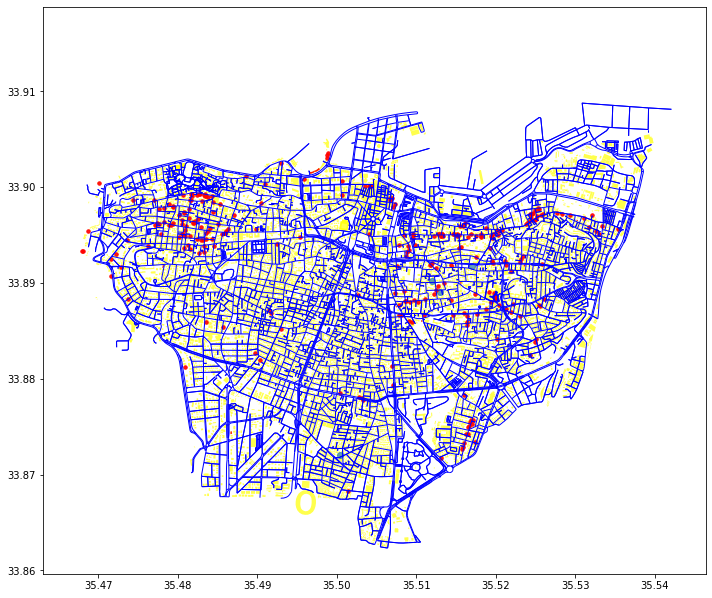

In [16]:
fig, ax = plt.subplots(figsize=(10, 14))
area.plot(ax=ax, facecolor='white')
edges.plot(ax=ax, linewidth=1, edgecolor='blue')
buildings.plot(ax=ax, facecolor='yellow', alpha=0.7)
restaurants.plot(ax=ax, color='red', alpha=0.9, markersize=12)
plt.tight_layout()

In [17]:
K_map = KeplerGl()
K_map.add_data(data=restaurants, name='Restaurants')
K_map.add_data(data=buildings, name='Buildings')
K_map.add_data(data=edges, name='Edges')
K_map.add_data(data=area, name='Area')
K_map.save_to_html()

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to keplergl_map.html!


In [21]:
it_resturants = restaurants.loc[restaurants.cuisine.str.contains('italian')
                                  .fillna(False)].dropna(axis=1, how='all')
#resturant_choice = it_resturants[it_resturants['name'] == 'Antica Roma']
resturant_choice = it_resturants[it_resturants['name'] =="لا بيازا"]
orig = list(graph)[993]
dest = ox.nearest_nodes(graph, 
          resturant_choice['geometry'][0].xy[0][0],
          resturant_choice['geometry'][0].xy[1][0])
nodes[nodes.index == orig]

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
290324534,33.892925,35.509685,3,NaN,NaN,POINT (35.50969 33.89292)


In [22]:
route = nx.shortest_path(graph, orig, dest, weight='length')
ox.plot_route_folium(graph, route, route_linewidth=6, node_size=0)
